# Cinemática do Braço Antropomórfico (3R)
Este notebook utiliza a biblioteca `DH` refatorada para calcular a cinemática direta (algébrica e numérica), a propagação de erros, os ângulos de Euler e plotar tanto o mecanismo em 3D quanto o seu espaço de trabalho (Workspace).

In [ ]:
import sys
sys.path.append('../') 
%load_ext autoreload
%autoreload 2

import sympy as sp
import numpy as np
import DH

## 1. Construindo o Mecanismo e Variáveis

In [2]:
# Define the DH parameters: (Anthropomorphic Arm)
Anthropomorphic_Arm  = [
    {'type': 'revolute', 'a': 0, 'alpha': sp.pi/2, 'd': 0,
     'errors': {'sigma': 1.02469, 'epsilon': 0.3606, 'beta': 0.0181, 'phi': 0}},

    {'type': 'revolute',  'a': 80, 'alpha': 0, 'd': 0, 
     'errors': {'sigma': 1.02469, 'epsilon': 0.3606, 'beta': 0.0181, 'phi': 0}},

    {'type': 'revolute', 'a': 60, 'alpha': 0, 'd': 0, 
     'errors': {'sigma': 0.76852, 'epsilon': 0.3606, 'beta': 0.0181, 'phi': 0}}
]

# Create the robot and the plotter:
robot = DH.Mechanism(Anthropomorphic_Arm)
plotter = DH.MechanismPlotter(robot)

# Evaluate the position of the effector using optional variable values:
variable_values = {
    robot.theta[0]: sp.pi/12,   # theta_0 for the first joint
    robot.theta[1]: sp.pi/6,    # theta_1 for the second joint   
    robot.theta[2]: sp.pi/4,    # theta_2 for the third joint
}

# Ranges de movimento para o Workspace (Monte Carlo)
ranges_movimento = {
    robot.theta[0]: (-sp.pi, sp.pi),       # Base gira 360 graus
    robot.theta[1]: (-sp.pi/2, sp.pi/2),   # Ombro (limite hipotético)
    robot.theta[2]: (-sp.pi/2, sp.pi/2)    # Cotovelo (limite hipotético)
}

## 2. Cálculos Algébricos Simbólicos (Com e Sem Erros)

In [3]:
"""Begin the calculations algebrically"""

# Calculate the forward kinematics without errors:
matrix_g, position_g = robot.forward_kinematics(apply_errors=False)
print("Matrix and position algebrical without errors:\n")
print("Position:\n", position_g)

# Calculate the forward kinematics with errors:
matrix_g_e, position_g_e = robot.forward_kinematics(apply_errors=True)
print("\nMatrix and position algebrical with errors:\n")
print("Position:\n", position_g_e)

Matrix and position algebrical without errors:

Position:
 Matrix([[a_0*cos(theta_0) - a_1*sin(theta_0)*sin(theta_1)*cos(alpha_0) + a_1*cos(theta_0)*cos(theta_1) - a_2*(sin(theta_0)*sin(theta_1)*cos(alpha_0) - cos(theta_0)*cos(theta_1))*cos(theta_2) - a_2*(-sin(alpha_0)*sin(alpha_1)*sin(theta_0) + sin(theta_0)*cos(alpha_0)*cos(alpha_1)*cos(theta_1) + sin(theta_1)*cos(alpha_1)*cos(theta_0))*sin(theta_2) + d_1*sin(alpha_0)*sin(theta_0) + d_2*(sin(alpha_0)*sin(theta_0)*cos(alpha_1) + sin(alpha_1)*sin(theta_0)*cos(alpha_0)*cos(theta_1) + sin(alpha_1)*sin(theta_1)*cos(theta_0))], [a_0*sin(theta_0) + a_1*sin(theta_0)*cos(theta_1) + a_1*sin(theta_1)*cos(alpha_0)*cos(theta_0) + a_2*(sin(theta_0)*cos(theta_1) + sin(theta_1)*cos(alpha_0)*cos(theta_0))*cos(theta_2) - a_2*(sin(alpha_0)*sin(alpha_1)*cos(theta_0) + sin(theta_0)*sin(theta_1)*cos(alpha_1) - cos(alpha_0)*cos(alpha_1)*cos(theta_0)*cos(theta_1))*sin(theta_2) - d_1*sin(alpha_0)*cos(theta_0) - d_2*(sin(alpha_0)*cos(alpha_1)*cos(theta_0) - 

## 3. Matrizes Nominais (Validação de Livro)
Extração das matrizes apenas substituindo a base de DH, mantendo thetas algébricos.

In [4]:
"""Begin the calculations numerically (Base Validation):"""

# Note que não enviamos variable_values, logo Thetas permanecem simbólicos
matrix_g_numerical, position_g_numerical, orientation_g_numerical = robot.evaluate_param(T=matrix_g, apply_errors=False)

print("Matrix numerical without errors (Book Validation):\n")
for i in range(matrix_g_numerical.shape[0]):
    for j in range(matrix_g_numerical.shape[1]):
        print(f"Element ({i},{j}): {matrix_g_numerical[i,j]}")

Matrix numerical without errors (Book Validation):

Element (0,0): 1
Element (0,1): 0
Element (0,2): 0
Element (0,3): 140
Element (1,0): 0
Element (1,1): 0
Element (1,2): -1
Element (1,3): 0
Element (2,0): 0
Element (2,1): 1
Element (2,2): 0
Element (2,3): 0
Element (3,0): 0
Element (3,1): 0
Element (3,2): 0
Element (3,3): 1


## 4. Aplicação das Variáveis e Cálculo de Erros
Aqui injetamos as `variable_values` para ter as matrizes numéricas (numpy array).

In [5]:
"""Start calculations numerically with optional variable values (graphical example):"""

# Matrizes finais avaliadas como Floats (Numpy)
matrix_num, position_num, orientation_num = robot.evaluate_param(T=matrix_g, variable_values=variable_values, apply_errors=False)
matrix_num_e, position_num_e, orientation_num_e = robot.evaluate_param(T=matrix_g_e, variable_values=variable_values, apply_errors=True)

print("[X, Y, Z] position values:")
print("Position without errors: \n", np.round(position_num, 4))
print("\nPosition with errors: \n", np.round(position_num_e, 4))

# Chamada da nova função estática de erro usando as posições avaliadas
error = DH.Mechanism.evaluate_error(position_num, position_num_e)
print("\nError value (Distance in mm): \n", round(error, 4))

# Calculate the euler angles (Nova função estática precisa receber a matriz de rotação):
print("\nEuler angles: Yaw(Z), Pitch(Y), Roll(X) em Radianos")
print("Without errors: \n", np.round(DH.Mechanism.get_euler_angles(orientation_num), 4))
print("With errors: \n", np.round(DH.Mechanism.get_euler_angles(orientation_num_e), 4))

[X, Y, Z] position values:
Position without errors: 
 [81.9213 21.9507 97.9555]

Position with errors: 
 [84.8195 19.3171 99.5157]

Error value (Distance in mm): 
 4.2154

Euler angles: Yaw(Z), Pitch(Y), Roll(X) em Radianos
Without errors: 
 [ 1.5708 -1.309   0.2618]
With errors: 
 [ 1.7188 -1.3071  0.1454]


## 5. Visualização Cinemática e Espaço de Trabalho (Workspace)

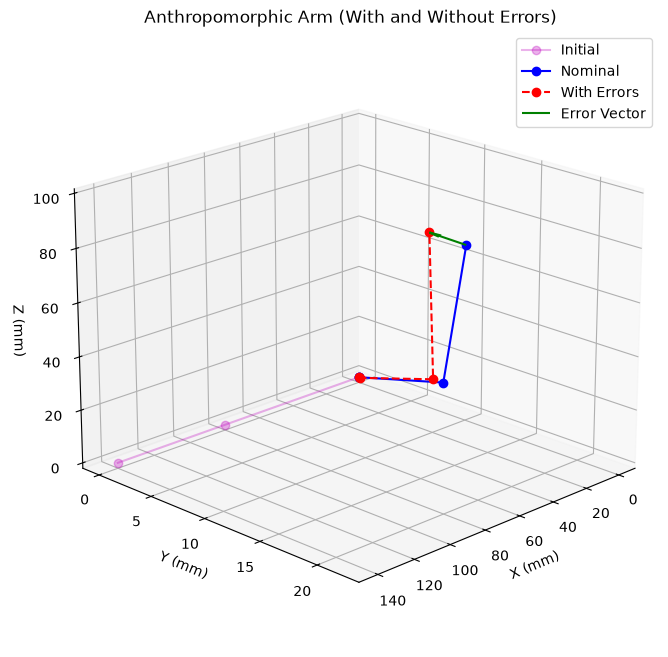

In [6]:
# Plotting the 3D mechanism using the new MechanismPlotter class
plotter.plot_mechanism(
    variable_values=variable_values, 
    title='Anthropomorphic Arm (With and Without Errors)', 
    plot_type='3d'
)

In [8]:
# 1. Definir a posição inicial (robô na posição zero / repouso)
posicao_inicial = {
    robot.theta[0]: 0.0,
    robot.theta[1]: 0.0,
    robot.theta[2]: 0.0
}

# 2. Definir a posição final (usando os valores que você definiu para pesquisa)
# Convertendo para float nativo para garantir que a animação processe rapidamente
posicao_final = {
    robot.theta[0]: float(sp.pi/12),  # 15 graus
    robot.theta[1]: float(sp.pi/6),   # 30 graus
    robot.theta[2]: float(sp.pi/4)    # 45 graus
}

# 3. Gerar a simulação de movimento em 3D!
plotter.simulate_movement(
    start_values=posicao_inicial, 
    end_values=posicao_final, 
    frames=60,       # 60 quadros para um movimento bem fluido
    interval=40,     # 40 ms de intervalo (25 FPS)
    plot_type='3d',
    title="Simulação de Movimento - Braço Antropomórfico"
)

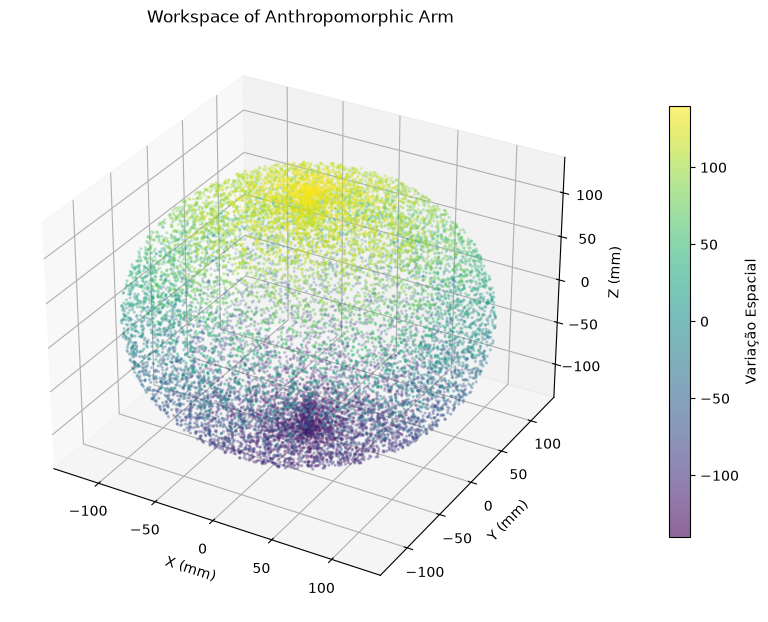

In [7]:
# Plotting the workspace (Nuvem de Pontos / Monte Carlo)
plotter.plot_workspace(
    joint_ranges=ranges_movimento,
    num_samples=15000, # Aumentado para 15k para melhor resolução em 3 graus de liberdade
    apply_errors=False,
    title='Workspace of Anthropomorphic Arm'
)